# Capstone Project - Main Notebook - Team 3

# Packages 

**Python Packages**

In [1]:
from pathlib import Path # path package
import rpy2 # load R
import warnings # hide warnings
warnings.filterwarnings('ignore')

import pandas as pd # pandas package
pd.options.display.max_columns = 40

import numpy as np # numpy package

# matplotlib packages
import matplotlib
import matplotlib.pyplot as plt 
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)

import seaborn as sns # seaborn package
# dictionary package
from collections import Counter, defaultdict

import warnings  # warnings package
warnings.filterwarnings('ignore')
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

# plotly packages
from chart_studio import plotly
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import iplot

# cufflink packages
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

# interactive shell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'last_expr'

from pathlib import Path # path package
import re #regex package
from textblob import TextBlob #import textblob package

# word cloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# nltk packages
import nltk

#nltk.download('stopwords')
# stop words
from nltk.corpus import stopwords
sw = set(stopwords.words("english"))

# punctuation
from string import punctuation

# detokenizer 
from nltk.tokenize.treebank import TreebankWordDetokenizer

# sklearn packages
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

#imblean packages for undersampling/oversampling
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import NearMiss 
from imblearn.under_sampling import OneSidedSelection

# pickle package
import _pickle as cPickle
import joblib

**R-packages**

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R
library(pacman)
library(pander)
library(dplyr)
library(RCurl)
library(XML)
library(rvest)
library(purrr)

# Web-Scraping

- Already ran in separate notebook

**R-Code**

In [ ]:
amz_reviews_scraper <- function(page_num) {
  
  # verified purchase reviews only
  #url <- "https://www.amazon.com/Google-GA00439-US-Chromecast-3rd-Generation/product-reviews/B015UKRNGS/ref=cm_cr_arp_d_viewopt_srt?ie=UTF8&reviewerType=avp_only_reviews&pageNumber="
  
  # put product reviews url here (all reviews)
  url <- "https://www.amazon.com/Google-GA00439-US-Chromecast-3rd-Generation/product-reviews/B015UKRNGS/ref=cm_cr_dp_d_show_all_btm?ie=UTF8&reviewerType=all_reviews&pageNumber="
  url_reviews <- paste0(url, page_num)
  
  # read url and each page as html
  doc <- read_html(url_reviews)

  # parse the content
  map_dfr(doc %>% html_elements("[id^='customer_review']"), ~ data.frame(
    # extract tile
    review_title = .x %>% html_element(".review-title") %>% html_text2(),
    
    # extract review
    review_text = .x %>% html_element(".review-text-content") %>% html_text2(),
    
    # extract ratings
    review_star = .x %>% html_element(".review-rating") %>% html_text2(),
    
    # extract date of review
    date = .x %>% html_element(".review-date") %>% html_text2() %>% gsub(".*vom ", "", .),
    
    # extract author of review
    author = .x %>% html_element(".a-profile-name") %>% html_text2(),
    
    # extract page number of review page
    page = page_num
  )) %>%
    
    # return as table
    as_tibble %>%
    return()
}

In [ ]:
# Combine Reviews into Dataframe and Export as CSV File
# start timer
start.time <- Sys.time()

# put number of page here (each page extract 10 reviews)
page_num <- 20

# create data frame and append each review to the same data frame
df_total <- data.frame()

# loop over number of pages until desired number
for (x in 1:page_num) {
  # run scraper in each 
  each_page <- amz_reviews_scraper(page_num = x )
  
  # turn tibble into data frame
  df <- data.frame(each_page)
  
  # combine with original data frame
  df_total <- rbind(df_total, df)
}

# export to csv - make sure to specify the file name 
write.csv(df_total, "google_chromecast.csv", row.names = FALSE)


# end timer
end.time <- Sys.time()
time.taken <- round(end.time - start.time,2)
print(paste0("Total time alloted: ", time.taken))

In [ ]:
# view data frame
head(df_total, 15) %>% select(review_text, review_star) %>%
  pander(style = "grid", caption = "Example of Amazon Web-Scraped Product Reviews")

# Load Data sets from Web-Scrapping

## Amazon Fire TV Stick

**Python Code**

In [2]:
# amazon fire tv stick data set
amz_df = pd.read_csv(Path(r"Data/Raw Data/amz_firestick.csv"),  encoding='cp1252')

# product name
amz_df['product'] = 'Amazon Fire TV Stick'

# look at 5 random samples
amz_df.sample(5)

,review_title,review_text,review_star,date,author,page,product
3800,I’m so glad I bought this device life is so mu...,Tv viewing,5.0 out of 5 stars,"Reviewed in the United States on February 1, 2022",phillip newcomb,381,Amazon Fire TV Stick
2816,Remote,The only thing about the remote that I am not ...,5.0 out of 5 stars,"Reviewed in the United States on January 3, 2022",Amanda Levy,282,Amazon Fire TV Stick
2235,"Very good, I like it.",The connector to the Fire TV Stick on the side...,5.0 out of 5 stars,"Reviewed in the United States on June 2, 2022",Leah Holt,224,Amazon Fire TV Stick
2733,It's Awesome,I replaced my older fire stick,5.0 out of 5 stars,"Reviewed in the United States on November 27, ...",Jacqueline Barbee,274,Amazon Fire TV Stick
1390,Cool item,Allows for you to do voice command when you ju...,5.0 out of 5 stars,"Reviewed in the United States on January 13, 2022",Crystal Dawson,140,Amazon Fire TV Stick


## Google ChromeCast

In [3]:
# google chromecast data set
google_df = pd.read_csv(Path(r"Data/Raw Data/google_chromecast.csv"),  encoding='cp1252')

# add product name
google_df['product'] = 'Google ChromeCast'

# look at 5 random samples
google_df.sample(5)

,review_title,review_text,review_star,date,author,page,product
3079,A must have if your TV is not a smart TV,Love this Chromecast this 3rd generation is ju...,5.0 out of 5 stars,"Reviewed in the United States on July 11, 2019",Alonso Nunez,308,Google ChromeCast
2698,It j it does not work HBO works but sometimes ...,The reason I got it I thought it would work go...,3.0 out of 5 stars,"Reviewed in the United States on June 25, 2021",nick,270,Google ChromeCast
4072,Imagen,"Para un TV, que no era smart.",5.0 out of 5 stars,"Reviewed in the United States on January 17, 2022",Amazon Customer,408,Google ChromeCast
3159,Great product!!!,"Works great, arrived quick. Love it!!!",5.0 out of 5 stars,"Reviewed in the United States on March 28, 2021",Yolie Aguirre,316,Google ChromeCast
524,convenient dongle,I love it.,5.0 out of 5 stars,"Reviewed in the United States on March 4, 2021",Christopher,53,Google ChromeCast


## Roku Remote 

In [4]:
# roku remote data set
roku_df = pd.read_csv(Path(r"Data/Raw Data/roku_remote.csv"),  encoding='cp1252')

# add product name
roku_df['product'] = 'Roku Remote'

# look at 5 random samples
roku_df.sample(5)

,review_title,review_text,review_star,date,author,page,product
3505,Great for streaming but the remote is lacking,This is a great device for streaming. Have no ...,4.0 out of 5 stars,"Reviewed in the United States on November 18, ...",Beth,351,Roku Remote
2238,It works great,Love it!,5.0 out of 5 stars,"Reviewed in the United States on May 3, 2019",James S.,224,Roku Remote
2887,"Pretty good, overheats","We have really enjoyed our Roku in the past, s...",4.0 out of 5 stars,"Reviewed in the United States on November 12, ...",EMG,289,Roku Remote
4457,Roku's new stick + is a solid streaming device,After reading that Roku's new streaming stick ...,4.0 out of 5 stars,"Reviewed in the United States on January 6, 2018",CleFan4Ever,446,Roku Remote
4578,Works fine; seems a bit slow to respond,Purchased this to use primarily with Youtube T...,4.0 out of 5 stars,"Reviewed in the United States on December 25, ...",RD,458,Roku Remote


## Apple TV

In [5]:
# apple tv data set
apple_df = pd.read_csv(Path(r"Data/Raw Data/apple_tv.csv"),  encoding='cp1252')

# product name
apple_df['product'] = 'Apple TV'

# look at 5 random samples
apple_df.sample(5)

,review_title,review_text,review_star,date,author,page,product
2724,Apple TV 64GB 4K,Great product,5.0 out of 5 stars,"Reviewed in the United Kingdom on December 7, ...",Amos J.,273,Apple TV
325,Ease of Use,Voice Recognition and Remote Control could be ...,5.0 out of 5 stars,"Reviewed in the United States on February 24, ...",Peter Pan,33,Apple TV
2488,love it,no dislikes. apple makes good products,5.0 out of 5 stars,"Reviewed in the United States on August 17, 2019",Justin Gordon,249,Apple TV
2153,"Does what it's supposed to, after some tweaks","2 Probs with this machine. First, I guess some...",4.0 out of 5 stars,"Reviewed in the United States on June 11, 2019",D Wick,216,Apple TV
535,"The remote is complete garbage, everything els...",I love this product except for the remote. The...,3.0 out of 5 stars,"Reviewed in the United States on November 30, ...",J. Loomis,54,Apple TV


## Merge all Data Sets 

In [6]:
# concat all data sets into one
df = pd.concat([amz_df, google_df, roku_df, apple_df], axis=0)

# look at 5 random samples
df.sample(5)

,review_title,review_text,review_star,date,author,page,product
3064,Great for Oculus Quest!,I literally only own this as an 'on the go' ca...,4.0 out of 5 stars,"Reviewed in the United States on February 2, 2020",Sami,307,Google ChromeCast
472,Great for HD video Streaming,I timely received this product. I was having s...,5.0 out of 5 stars,"Reviewed in the United States on June 16, 2020",Papa B,48,Roku Remote
1944,User interface and working each time I access,Streaming movies and shows,3.0 out of 5 stars,"Reviewed in the United States on July 8, 2021",Anna Sweetie,195,Apple TV
4711,Awsome but not ideal,Awsome device but not having a remote is painf...,3.0 out of 5 stars,"Reviewed in the United States on December 19, ...",A.R.,472,Google ChromeCast
4039,Must buy 3rd gen,Very good product. The 3rd Gen upgrades are ve...,5.0 out of 5 stars,"Reviewed in the United States on November 28, ...",Nurse Tina,404,Google ChromeCast


# Pre-cleaning 

1. Remove the rows where `review_text` column were missing
2. Fix `review_star` to have numeric value of ratings 
3. fix `date` to be parsed and converted into datetime object
4. Make suring we have actual string dtype columns
5. Convert `review_title`, `review_text`, `author`, and `product` to string types
6. Adding Sentiment Polarity Scores for `review_text` as a new column `polarity`
7. Adding Length of Reviews as a new column `review_len`
8. Adding the Word Count in each Reviews as a new column `word_count`


##  Remove missing values in review_text


In [7]:
# original data frame dimensions before removing null values in `review_text`
df.shape

(17740, 7)

In [8]:
# remove null values in `review_text`
df = df[~df['review_text'].isnull()]

# data frame dimensions after removing null values
df.shape

(17696, 7)

## Cleaning `review_star`

In [9]:
## extract rating from strings and convert to float type
df['review_star'] = df['review_star'].apply(lambda x: re.findall(r'^[0-9]\.[0-9]?', x)[0]).astype(float)

# sample only 5 rows
df['review_star'].sample(5)

1202    5.0
2362    5.0
1628    5.0
4740    5.0
30      5.0
Name: review_star, dtype: float64

## Convert `review_title`, `review_text`, `author`, and `product` to string types

In [10]:
# convert review title column into string type
df['review_title'] = df['review_title'].astype("string")

# convert review text column into string type
df['review_text'] = df['review_text'].astype("string")

# convert author column into string type
df['author'] = df['author'].astype("string")

# convert product column into string type
df['product'] = df['product'].astype("string")

## Adding Sentiment Polarity Scores as `polarity`

In [11]:
# create new column for sentiment polarity scores
df['polarity'] = df['review_text'].map(lambda text: TextBlob(text).sentiment.polarity)

# sample only 5 rows
df['polarity'].sample(5)

4776    1.000000
1276    0.400000
4521    0.366667
2351    0.050000
1549   -0.125000
Name: polarity, dtype: float64

### Preview 5 randomly selected reviews with the highest sentiment polarity score

In [12]:
# Print statement
print('5 random reviews with the highest positive sentiment polarity: \n')

# Randomly sample review texts with highest positive sentiment polarity scores
cl = df.loc[df.polarity == 1, ['review_text']].sample(5).values

# print out each one
for c in cl:
    print(c[0])

5 random reviews with the highest positive sentiment polarity: 

Works great!?
Awesome device!
Used for my place of business to display our Untappd menu. Works great!
This device is wonderful. I can watch everything. It turned my TV into a laptop.
It streams 4K flawlessly and the volume and power buttons work on my TV.


### Preview 5 randomly selected reviews with the most neutral sentiment polarity score

In [13]:
# Print statement
print('5 random reviews with the most neutral sentiment(zero) polarity: \n')

# Randomly sample review texts with highest neutral sentiment polarity scores
cl = df.loc[df.polarity == 0, ['review_text']].sample(5).values

# print out each one
for c in cl:
    print(c[0])

5 random reviews with the most neutral sentiment(zero) polarity: 

Use to stream gameplay to tv for my oculus quest VR headset otherwise no use to me since I have an Amazon firestick.
This works well.
FOR mytv
our family loves this product, makes watching our netflix on our tv simple
Works on our only TV without a Joey for dish anywhere.


### Preview 5 randomly selected reviews with the most negative sentiment polarity score

In [14]:
# Print Statement
print('5 reviews with the most negative polarity: \n')

# Randomly sample review texts with highest negative sentiment polarity scores
cl = df.loc[df.polarity <= -1.0, ['review_text']].sample(5).values

# Print out each one
for c in cl:
    print(c[0])

5 reviews with the most negative polarity: 

Arrived today and it has been used! No place in description does it mention that this item was refurbished. Box wasn’t even sealed and you can tell that it has been used and returned. Very unhappy!!!
Terrible
The interface with all existing services is terrible.
Very annoying to use app. Have to pay for monthly fee for app.
Terrible


## Adding Length of Reviews as `review_len`

In [15]:
# create new column called review_len for length of reviews
df['review_len'] = df['review_text'].astype(str).apply(len)

# sample only 5 rows
df['review_len'].sample(5)

1864    464
2594     60
2196     44
1352     12
3658     29
Name: review_len, dtype: int64

## dding the Word Count in each Reviews as `word_count`

In [16]:
# create new column called word count for number of words in each reviews
df['word_count'] = df['review_text'].apply(lambda x: len(str(x).split()))

# sample only 5 rows
df['word_count'].sample(5)

4147     5
4116    52
2504    90
232     29
248     47
Name: word_count, dtype: int64

## Re-examine data now

In [17]:
# preview new clean columns with only 10 samples
df.sample(10)

,review_title,review_text,review_star,date,author,page,product,polarity,review_len,word_count
715,It works,It was simple to install.,5.0,"Reviewed in the United States on June 14, 2022",karen Beaubien,72,Google ChromeCast,0.000000,25,5
3936,Product Quit Working,We purchased this for our daughter in college....,1.0,"Reviewed in the United States on November 21, ...",April Holcomb,394,Roku Remote,0.032653,458,90
1729,Excelente artículo fácil de usar,"La plataforma de roku es muy fácil de usar, ha...",5.0,"Reviewed in the United States on June 23, 2021",Edward lopez,173,Roku Remote,0.000000,72,15
1611,Works well!,Got this for a 2nd room and works very well! V...,5.0,"Reviewed in the United States on September 21,...",Sally,162,Roku Remote,0.271111,66,14
1223,My friend liked roku,Got for a friend and he loves it works just as...,5.0,"Reviewed in the United States on July 2, 2020",dalejr,123,Roku Remote,0.700000,72,16
1715,Not worth the money or effort,Pitiful streaming device. Your phone has to be...,2.0,"Reviewed in the United States on September 3, ...",Book Eater,172,Google ChromeCast,0.200000,311,55
2431,Great product,Upgraded our older box,5.0,"Reviewed in the United States on February 18, ...",JoAnn M. Deans,244,Apple TV,0.166667,22,4
4330,Ver much satisfied.,No doubt that it is famous product.,5.0,"Reviewed in the United States on August 9, 2019",YJK boylston,434,Google ChromeCast,0.500000,35,7
1971,La marca,Excelente,5.0,"Reviewed in the United States on December 9, 2021",Fernando Ca Decuzzi,198,Amazon Fire TV Stick,0.000000,9,1
3194,Good product!!,"I gave it For my parents to see Netflix, they ...",5.0,"Reviewed in the United States on September 4, ...",Marta,320,Google ChromeCast,0.390625,63,13


# Exploratory Data Analysis 

1. Examine a five-number summary of the numerical and categorical columns
2. Checking for Missing Data
3. Univariate Analysis
    
    - Distribution of review sentiment polarity score
    - Distribution of review ratings
    - Distribution of review lengths
    - Distribution of review word counts
    - Distribution of products
    

4. Multivariate Analysis
    
    - Sentiment Polarity Boxplot of Products
    - Product Ratings Bar Graph
    - Review Length Box-plot by Product
    - Word Count Box-plot by Product
    - 2D Density jointplot of Rating and Sentiment Polarity
    - Word Cloud of Reviews

## Examine a five-number summary of the numerical and categorical columns

In [18]:
# 5 number summary of the numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
review_star,17696.0,4.479204,1.185062,1.0,5.000000,5.00,5.0,5.0
page,17696.0,232.748361,142.237177,1.0,111.000000,222.00,352.0,500.0
polarity,17696.0,0.299442,0.309198,-1.0,0.025666,0.26,0.5,1.0
review_len,17696.0,205.686370,337.735191,1.0,34.000000,91.00,248.0,10046.0
word_count,17696.0,38.499491,62.225447,1.0,6.000000,17.00,47.0,1766.0


**Interpretation**


1. `review_star`: The range of the review ratings is 1 to 5 stars where the mean across all brands for streaming devices from this data set is 4.47.

2. `page`: The page number does not tell us much aside from that fact that we were able to scrape customer reviews from pages 1 to pages 500.

3. `polarity`: This is an interesting summary because the polarity sentiment score tells us on average we are seeing a 0.299 where -1.0 is the lowest and 1.0 is the highest. So typically on average, we are a bit past the neutral sentiment when looking at reviews on average.

4. `review_len`: This column specifies the length of each review, in this case on average we are seeing 205.68 characters per reviews with the least being 34 and max being 10,000 characters.

5. `word_count`: Where as the word count counts only words and on average there are 38.5 words per review with the least being 1 word and the most being 1,766 words.


**Looking at Categorical Columns**:

1. product

In [19]:
# summary statistic of products
df[['product']].describe().T

,count,unique,top,freq
product,17696,4,Roku Remote,5000


**Interpretation**

1. `product`: Since not all reviews were scraped equally from each brand and from our pre-cleaning work we also had to drop several rows with missing reviews, our new summary statistics of the `product` column tells us that `Roku Remote` product has the most reviews at 5000.

## Checking for Missing Data

In [20]:
# check for total missing rows across all columns
df.isna().sum()

review_title    3
review_text     0
review_star     0
date            0
author          1
page            0
product         0
polarity        0
review_len      0
word_count      0
dtype: int64

**Interpretation**: 

1. Since the columns `review_title` and `author` contain very little missing values and also does not impact the modeling phase later on, we will still keep these rows

## Univariate Analysis

- Distribution of review sentiment polarity score
- Distribution of review ratings
- Distribution of review lengths
- Distribution of review word counts
- Distribution of products

## Distribution of review sentiment polarity score

In [21]:
# plot review sentiment polarity scores with plotly
df['polarity'].iplot(
    kind='hist', # histogram
    bins = 50, # number of bins
    xTitle='Polarity', # xlabel
    color = "blue", # bar chart color
    linecolor='black', # bar chart line color
    yTitle='Count', # y label
    title='Sentiment Polarity Distribution') # title

**Interpretation**

1. The distribution seems to be left skewed with a longer left tail and the rest of the distribution is clustered around the positive polarity sentiment scores with a noticable peak at 0 or neutral.

##  Distribution of review ratings

In [22]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
rating_counts = pd.DataFrame(df[['review_star']].value_counts()).reset_index().rename( \
    columns={'review_star': 'Ratings', 0:'count'})

# add a sort index
rating_counts['Ratings_for_sorting'] = rating_counts['Ratings']

# convert ratings to str type for visualization
rating_counts['Ratings'] = rating_counts['Ratings'].astype(str)


# Sort order by custom column and display 
rating_counts.sort_values(by=['Ratings_for_sorting'], inplace = True)
rating_counts[['Ratings','count']]

,Ratings,count
1,1.0,1309
4,2.0,564
3,3.0,671
2,4.0,946
0,5.0,14206


In [23]:
# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(rating_counts, x="Ratings", y="count", color="Ratings", 
             title= "Customer Ratings", text_auto = '.2s', 
             color_discrete_map={'1.0':'red', '2.0':'orange', '3.0': 'yellow',
                                 '4.0':'rgb(179,226,205)', '5.0':'rgb(27,158,119)'})

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
 marker_line_width=1.5, opacity = 0.75)


## Distribution of review lengths

In [24]:
# plot review lengths plotly
df['review_len'].iplot(
    kind='hist', # histogram
    bins = 200, # number of bins
    xTitle='Length', # xlabel
    color = "green", # bar chart color
    linecolor='black', # bar chart line color
    yTitle='Count', # y label
    title='Length of Reviews Distribution') # title

**Interpretation** 

1. A very right-skewed distribution with most reviews falling under 200 characters or less for the most counts.

## Distribution of review word counts

In [25]:
# plot review lengths plotly
df['word_count'].iplot(
    kind='hist', # histogram
    bins = 200, # number of bins
    xTitle='Words', # xlabel
    color = "orange", # bar chart color
    linecolor='black', # bar chart line color
    yTitle='Count', # y label
    title='Number of Words in Reviews Distribution') # title

**Interpretation**

1. A very right-skewed distribution with most reviews falling under 30 words or less per review for the most counts.

## Distribution of products

In [26]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
product_counts = pd.DataFrame(df[['product']].value_counts()).reset_index().rename(columns={0:'count'})
product_counts

,product,count
0,Roku Remote,5000
1,Google ChromeCast,4997
2,Amazon Fire TV Stick,4959
3,Apple TV,2740


In [27]:
# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(product_counts, x="product", y="count", color="product", title= "Streaming Devices by Brands",
            color_discrete_map={'Roku Remote':'purple', 'Google ChromeCast': 'red', 'Amazon Fire TV Stick':'orange', 'Apple TV':'black'},
            text_auto = '.2s')

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
marker_line_width=1.5, opacity=0.75)

**Interpretation**

1. Originally, Apple TV was only able to scrape 2,740 reviews and this seems to still be the case.
2. However, since we removed rows where reviews were missing, we can check accordingly and see that 3 rows were missing reviews from Google ChromeCast and 41 rows were missing reviews from Amazon Fire TV Stick.

## Multivariate Analysis 

- Sentiment Polarity Boxplot of Products
- Product Ratings Bar Graph
- Review Length Box-plot by Product
- Word Count Box-plot by Product
- 2D Density jointplot of Rating and Sentiment Polarity
- Word Cloud of Reviews

    - For all reviews across products 
    - For Amazon Fire TV Stick reviews
    - For Google ChromeCast reviews
    - For Roku Remote reviews
    - For Apple TV reviews 

### Sentiment Polarity Boxplot of Products

In [28]:
# Amazon Fire TV Stick Polarities
amz = df.loc[df['product'] == 'Amazon Fire TV Stick']['polarity']

# Google ChromeCast Polarities
google = df.loc[df['product'] == 'Google ChromeCast']['polarity']

# Roku Remote Polarities
roku = df.loc[df['product'] == 'Google ChromeCast']['polarity']

# Google ChromeCast Polarities
apple = df.loc[df['product'] == 'Apple TV']['polarity']

# Draw Boxplot for Amazon Fire TV Stick
trace0 = go.Box(
    y=amz,
    name = 'Amazon Fire TV Stick',
    marker = dict(
        color = 'orange', opacity=0.75
    )
)

# Draw Boxplot for Google ChromeCast
trace1 = go.Box(
    y=google,
    name = 'Google ChromeCast',
    marker = dict(
        color = 'red', opacity=0.75
    )
)

# Draw Boxplot for Roku Remote
trace2 = go.Box(
    y=roku,
    name = 'Roku Remote',
    marker = dict(
        color = 'purple', opacity=0.75
    )
)


# Draw Boxplot for Apple TV
trace3 = go.Box(
    y=apple,
    name = 'Apple TV',
    marker = dict(
        color = 'black', opacity=0.75
    )
)


# Combine all boxplots into one layout
data = [trace0, trace1, trace2, trace3]
layout = go.Layout(
    title = "Sentiment Polarity Boxplot of Products"
)

# Plot all boxplots as one figure
fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplot of Products")

**Intepretation**

1. Most brands are displaying a median polarity score between 0.21-0.31, indicating that 50% of each product's reviews contain neutral sentiments. 
2. Althought there are a few bad apples for Apple TV and Rokue Remote reviews ranging below -0.70.

## Product Ratings Bar Graph

In [29]:
product_ratings = df.groupby(['product', \
                              'review_star']).size().reset_index().rename(columns = {'review_star':'Ratings', 
                                                                                     0:'Count', 'product':'Product'})
product_ratings['Ratings'] = product_ratings['Ratings'].astype(str)
product_ratings

,Product,Ratings,Count
0,Amazon Fire TV Stick,1.0,62
1,Amazon Fire TV Stick,2.0,32
2,Amazon Fire TV Stick,3.0,39
3,Amazon Fire TV Stick,4.0,43
4,Amazon Fire TV Stick,5.0,4783
5,Apple TV,1.0,311
6,Apple TV,2.0,170
7,Apple TV,3.0,197
8,Apple TV,4.0,233
9,Apple TV,5.0,1829


In [30]:
# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(product_ratings, x="Product", y="Count", color="Ratings", title= "Product Ratings",
             color_discrete_map={'1.0':'red', '2.0':'orange', '3.0': 'yellow',
                                 '4.0':'rgb(179,226,205)', '5.0':'rgb(27,158,119)'},
            text_auto = '.2s', barmode='group')


# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
marker_line_width=1.5, opacity = .85)

**Intepretation**

1. Overall, 5/5 star ratings are the most dominant class across all products and the second most counted rating is 1/5 stars.

## Review Length Box-plot by Product

In [31]:
# Amazon Fire TV Stick Review Length
amz = df.loc[df['product'] == 'Amazon Fire TV Stick']['review_len']

# Google ChromeCast Review Length
google = df.loc[df['product'] == 'Google ChromeCast']['review_len']

# Roku Remote Review Length
roku = df.loc[df['product'] == 'Google ChromeCast']['review_len']

# Google ChromeCast Review Length
apple = df.loc[df['product'] == 'Apple TV']['review_len']

# Draw Boxplot for Amazon Fire TV Stick
trace0 = go.Box(
    y=amz,
    name = 'Amazon Fire TV Stick',
    marker = dict(
        color = 'orange', opacity=0.75
    )
)

# Draw Boxplot for Google ChromeCast
trace1 = go.Box(
    y=google,
    name = 'Google ChromeCast',
    marker = dict(
        color = 'red', opacity=0.75
    )
)

# Draw Boxplot for Roku Remote
trace2 = go.Box(
    y=roku,
    name = 'Roku Remote',
    marker = dict(
        color = 'purple', opacity=0.75
    )
)


# Draw Boxplot for Apple TV
trace3 = go.Box(
    y=apple,
    name = 'Apple TV',
    marker = dict(
        color = 'black', opacity=0.75
    )
)


# Combine all boxplots into one layout
data = [trace0, trace1, trace2, trace3]
layout = go.Layout(
    title = "Review Length Boxplot of Products"
)

# Plot all boxplots as one figure
fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Review Length Boxplot of Products")

## Word Count Boxplot by Product

In [32]:
# Amazon Fire TV Stick Word Count
amz = df.loc[df['product'] == 'Amazon Fire TV Stick']['word_count']

# Google ChromeCast Word Count
google = df.loc[df['product'] == 'Google ChromeCast']['word_count']

# Roku Remote Word Count
roku = df.loc[df['product'] == 'Google ChromeCast']['word_count']

# Google ChromeCast Word Count
apple = df.loc[df['product'] == 'Apple TV']['word_count']

# Draw Boxplot for Amazon Fire TV Stick
trace0 = go.Box(
    y=amz,
    name = 'Amazon Fire TV Stick',
    marker = dict(
        color = 'orange', opacity=0.75
    )
)

# Draw Boxplot for Google ChromeCast
trace1 = go.Box(
    y=google,
    name = 'Google ChromeCast',
    marker = dict(
        color = 'red', opacity=0.75
    )
)

# Draw Boxplot for Roku Remote
trace2 = go.Box(
    y=roku,
    name = 'Roku Remote',
    marker = dict(
        color = 'purple', opacity=0.75
    )
)


# Draw Boxplot for Apple TV
trace3 = go.Box(
    y=apple,
    name = 'Apple TV',
    marker = dict(
        color = 'black', opacity=0.75
    )
)


# Combine all boxplots into one layout
data = [trace0, trace1, trace2, trace3]
layout = go.Layout(
    title = "Word Count Boxplot of Products"
)

# Plot all boxplots as one figure
fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Word Count Boxplot of Products")

**Intepretation** 

1. For `review_len` - not much can be extracted from this beside that 50% of product reviews has a length of under 100 characters across all products.

2. For `word_count` - the same also applies here for insight except 50% of reviews have less than 25 words across all products.

## 2D Density jointplot of Rating and Sentiment Polarity

In [33]:
# scatter plot with review_star and polarity
trace1 = go.Scatter(
    x=df['review_star'], y=df['polarity'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)

# histogram with review_star and polarity
trace2 = go.Histogram2dContour(
    x=df['review_star'], y=df['polarity'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)

# histogram for review_star
trace3 = go.Histogram(
    x=df['review_star'], name='Rating density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)

# histogram for polarity
trace4 = go.Histogram(
    y=df['polarity'], name='Sentiment Polarity density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)

# combine all traces together
data = [trace1, trace2, trace3, trace4]

# set up  layout for density plot 
layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

# display figure
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

**Intepretation** 

1. The most dense regions are with the 5/5 star rating around the sentiment polarity score range of **0 to 0.5.**

### Word Clouds (for single tokens, bigrams, and trigrams)

- For all reviews across products 
- For Amazon Fire TV Stick reviews
- For Google ChromeCast reviews
- For Roku Remote reviews
- For Apple TV reviews 

**Pre-cleaning text for word cloud visualizations**

- Remove Punctuation
- Remove extra white space
- Tokenize on white space pattern
- Fold to lowercase
- Remove stopwords


In [34]:
# punctuation dictionary
punctuation = set(punctuation) 
include_punctuation = {'’', '”', '“'}
punctuation |= include_punctuation

# stop words and other words to be excluded
include_stopwords = {'could', 'shouldn', 'oh', 'know', 'im', 'en',
'go', 'get', 'got', 'gonna', 'la', 'na', 'de', 'gon', 'got' 'must', 'would', 'also', 
                    'apple', 'Apple', 'Amazon', 'amazon', 
                     'roku', 'Roku', 'roku remote', 'Rokue Remote',
                     'Google', 'google', 'chromecast', 'Chromecast', 
                    'Chrome Cast', 'chrome cast', 'chrome', 'cast'
                     'Fire TV Stick', 'prime',
                     'firestick', 'fire tv', 'fire tv stick', 'fire', 
                     'firesticks','tv', 'remote', '4k', 'stick', 'dont', "it's", 'tvs',
                    'etc'}

# include the dictionary of stop words
sw |= include_stopwords

# useful white space pattern
whitespace_pattern = re.compile(r"\s+")

def decontracted(phrase):
    """
    split up decontracted words from a column of texts
    
    """
    # add extra white space
    phrase = re.sub('(?<=[.,!?()/:;])(?=[^\s])', r' ',  phrase)
   
    # specific
    phrase = re.sub(r"she/her", "she her",phrase)
    phrase = re.sub(r"he/him", "he him",phrase)
    phrase = re.sub(r"they/them", "they them",phrase)
    phrase = re.sub(r"won\’t", "will not", phrase)
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\’t", "can not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r'\<.*\>', '', phrase)

    # general
    phrase = re.sub(r"n\’t", " not", phrase)
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\’re", " are", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\’s", " is", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\’d", " would", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\’ll", " will", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\’t", " not", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\’ve", " have", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\’m", " am", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    phrase = re.sub(r"don’t", "do not", phrase)
    phrase = re.sub(r"it's", "it is", phrase)
    phrase = re.sub(r"it’s", "it is", phrase)
    phrase = re.sub(r"we've", "we have", phrase)
    phrase = re.sub("\w+\d+", "", phrase)
    phrase = re.sub("\d+\w+", "", phrase)
    phrase = re.sub("\d+", " ", phrase)

    return phrase

def remove_stop(tokens) :
    """
    remove stop words from a column of texts
    """
    
    not_stop_words = [word for word in tokens if word not in sw]
    return not_stop_words
 
def remove_punctuation(text) : 
    """
    remove punctuation from a column of texts
    """
    return("".join([ch for ch in text if ch not in punctuation]))

def tokenize(text) : 
    """ Splitting on whitespace"""
    
    # modify this function to return tokens
    tokens = re.split(whitespace_pattern, text)
    return(tokens)


def remove_whitespace_token(tokens):
    """ Remove whitespace tokens"""
    
    # loop through each token to find whitespace token and remove
    for i in tokens:
        if '' in tokens:
            tokens.remove('')
    return tokens

def prepare(text, pipeline) :
    """
    prepare function applies each cleaning transformation
    function onto a column of text
    """
    tokens = str(text)
    
    for transform in pipeline : 
        tokens = transform(tokens)
        
    return(tokens)


# list of cleaning functions
my_pipeline = [str.lower, decontracted, remove_punctuation, tokenize, remove_whitespace_token, remove_stop]


# for creating bi and tri-grams
def ngrams(tokens, n=2, sep=' ', stopwords=sw):
    """
    function to create ngrams such as bi or tri-grams
    """
    return [sep.join(ngram) for ngram in zip(*[tokens[i:] for i in range(n)]) \
    if len([t for t in ngram if t in sw])==0]



In [35]:
# for cleaning and tokenizng reviews
df['clean_reviews'] = df['review_text'].apply(prepare,pipeline=my_pipeline)

# new column for bigrams
df['bigrams'] = df['review_text'].apply(prepare, pipeline=[str.lower, remove_punctuation,
                                                           tokenize]).apply(ngrams, n=2, stopwords=sw)

# new column for trigrams
df['trigrams'] = df['review_text'].apply(prepare, pipeline=[str.lower, remove_punctuation,
                                                            tokenize]).apply(ngrams, n=3, stopwords=sw)

**Frequency Diagram - Top 15 Words, Bigrams, and Trigrams**

In [36]:
def count_words(df = df, column='clean_reviews', preprocess=None, min_freq=2):
    # process tokens and update counter
    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens)

    # create counter and run through all data
    counter = Counter()
    df[column].map(update)

    # transform counter into a DataFrame
    freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
    freq_df = freq_df.query('freq >= @min_freq')
    freq_df.index.name = 'token'
    
    # return new dataframe sorted by highest frequency by word
    return freq_df.sort_values('freq', ascending=False)

# create new dataframe with clean words and counts
freq_df = count_words(df).reset_index()



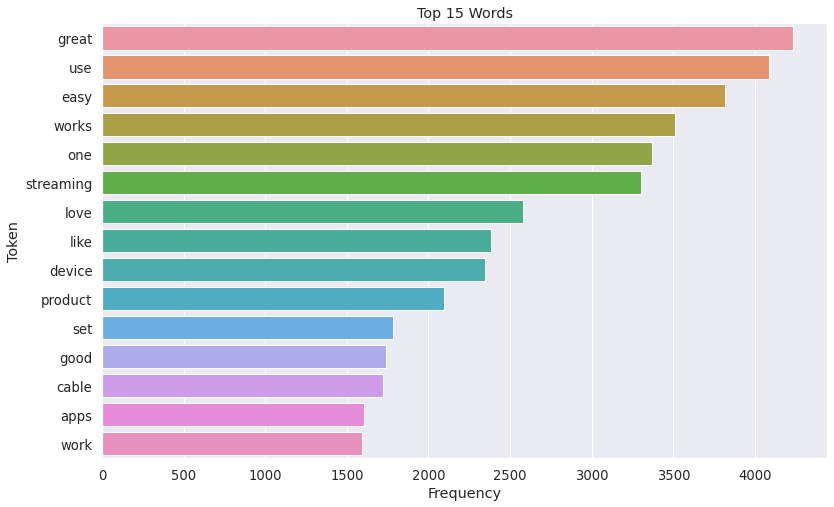

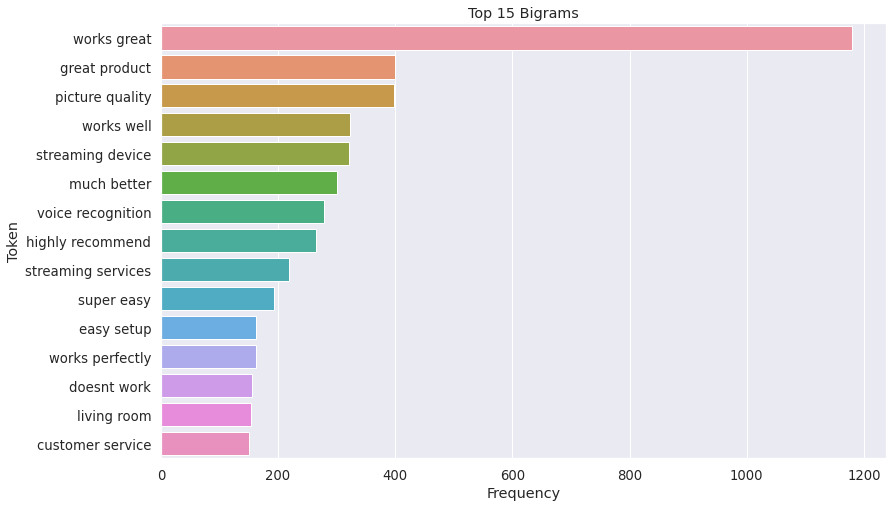

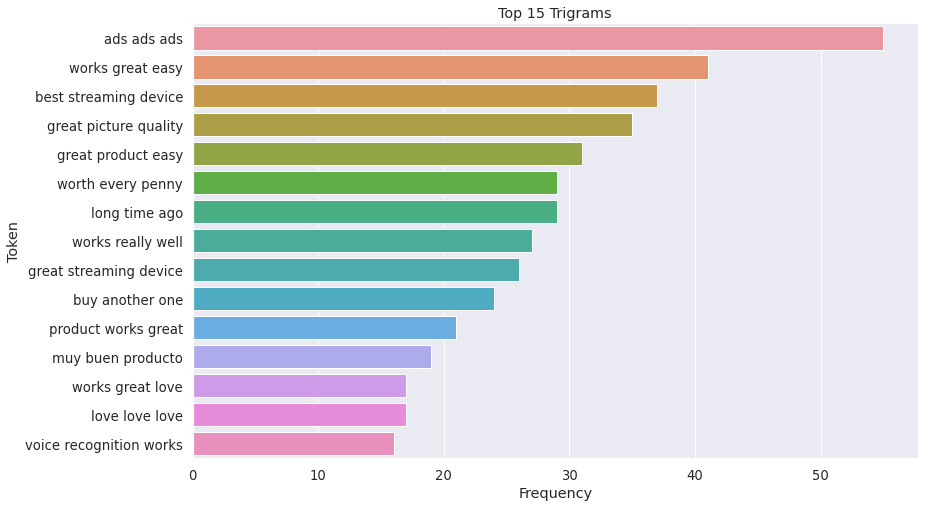

In [37]:
# Plot Frequency Diagram
plt.figure(figsize=(13,8))
sns.set(font_scale = 1.2)
sns.barplot(x="freq", y="token", data=freq_df.head(15), orient = "h")

# title 
plt.title("Top 15 Words")

# x-label
plt.xlabel("Frequency")

# y-label
plt.ylabel("Token")

# display plot
plt.show()

# create new dataframe with clean words and counts for bigrams
freq_df = count_words(df, column='bigrams').reset_index()

# Plot Frequency Diagram
plt.figure(figsize=(13,8))
sns.set(font_scale = 1.2)
sns.barplot(x="freq", y="token", data=freq_df.head(15), orient = "h")

# title 
plt.title("Top 15 Bigrams")

# x-label
plt.xlabel("Frequency")

# y-label
plt.ylabel("Token")

# display plot
plt.show()


# create new dataframe with clean words and counts for trigrams
freq_df = count_words(df, column='trigrams').reset_index()

# Plot Frequency Diagram
plt.figure(figsize=(13,8))
sns.set(font_scale = 1.2)
sns.barplot(x="freq", y="token", data=freq_df.head(15), orient = "h")

# title 
plt.title("Top 15 Trigrams")

# x-label
plt.xlabel("Frequency")

# y-label
plt.ylabel("Token")

# display plot
plt.show()

**All Reviews across products word cloud**

In [38]:
def wordcloud(word_freq, title=None, max_words=200, stopwords=None):
    # Create word cloud
    wc = WordCloud(width=800, height=400,
        background_color= "black", colormap="Paired",
        max_font_size=150, max_words=max_words)

    # convert DataFrame into dict
    if type(word_freq) == pd.Series:
        counter = Counter(word_freq.fillna(0).to_dict())
    else:
        counter = word_freq
    # filter stop words in frequency counter
    if stopwords is not None:
        counter = {token:freq for (token, freq) in counter.items() if token not in stopwords}
    
    # generate word cloud plot
    wc.generate_from_frequencies(counter)
    plt.title(title)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

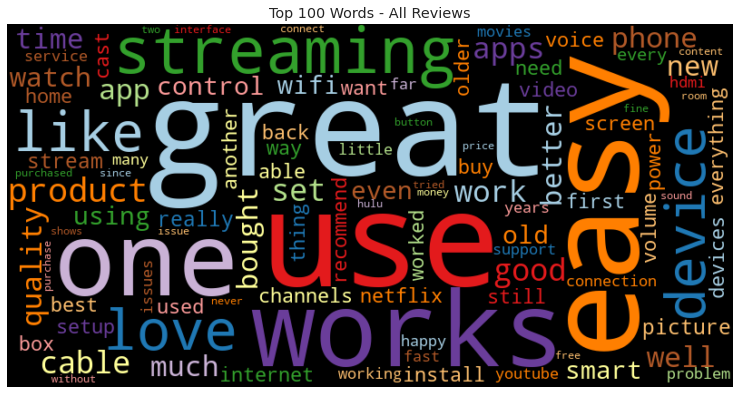

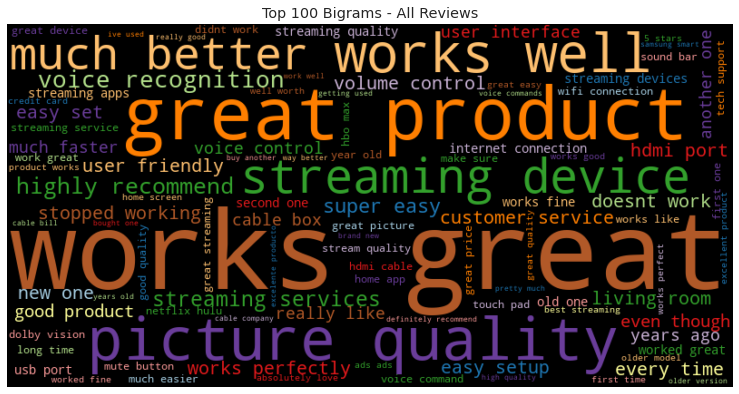

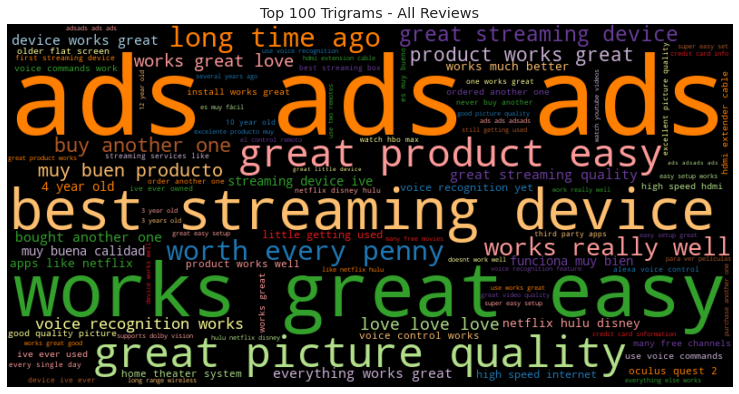

In [39]:
# Plot Word Cloud
plt.figure(figsize=(13,8))

# call count_words function on df 
freq_df = count_words(df)

# select top 100 words
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Words - All Reviews")
plt.show()

# Plot Word Cloud - bigrams
plt.figure(figsize=(13,8))

# call count_words function on df 
freq_df = count_words(df, column="bigrams")

# select top 100 bigrams
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Bigrams - All Reviews")
plt.show()


# Plot Word Cloud - trigrams
plt.figure(figsize=(13,8))

# call count_words function on df 
freq_df = count_words(df, column="trigrams")

# select top 100 trigrams
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Trigrams - All Reviews")
plt.show()

**Amazon Fire TV Stick Reviews word cloud**

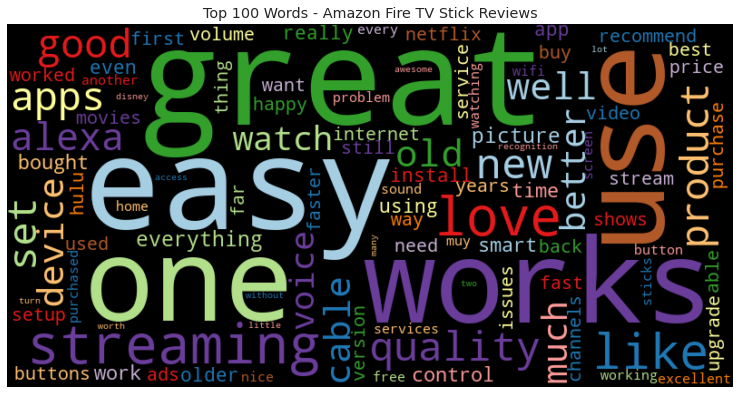

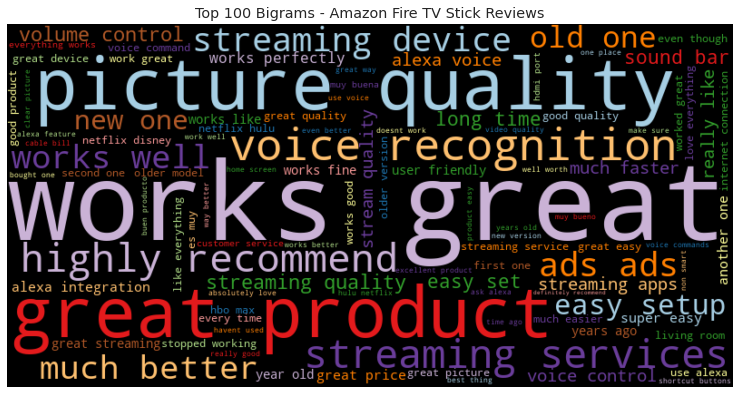

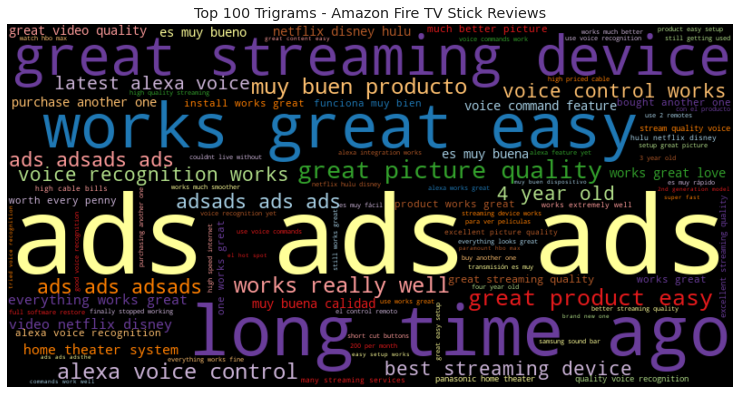

In [40]:
# Create a word cloud for amazon product
amazon = ['Amazon Fire TV Stick']
amazon_df = df[df['product'].isin(amazon)]

# Plot Word Cloud - top 100 words
plt.figure(figsize=(13,8))

# amazon fire tv stick reviews only
freq_df = count_words(amazon_df)
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Words - Amazon Fire TV Stick Reviews")
plt.show()

# Plot Word Cloud - bigrams
plt.figure(figsize=(13,8))

# call count_words function on amazon
freq_df = count_words(amazon_df, column="bigrams")

# select top 100 bigrams for amazon
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Bigrams - Amazon Fire TV Stick Reviews")
plt.show()


# Plot Word Cloud - trigrams
plt.figure(figsize=(13,8))

# call count_words function on amazon
freq_df = count_words(amazon_df, column="trigrams")

# select top 100 trigrams - amazon
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Trigrams - Amazon Fire TV Stick Reviews")
plt.show()

**Google ChromeCast Reviews Word Cloud**

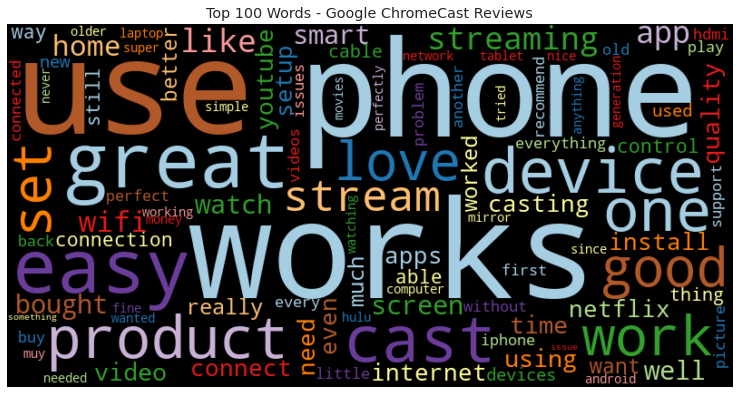

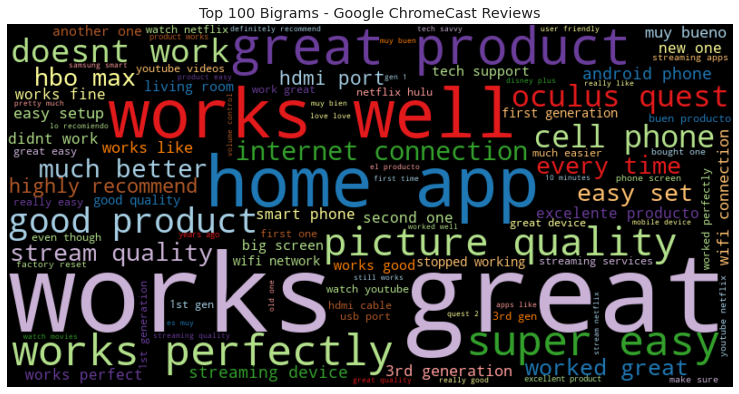

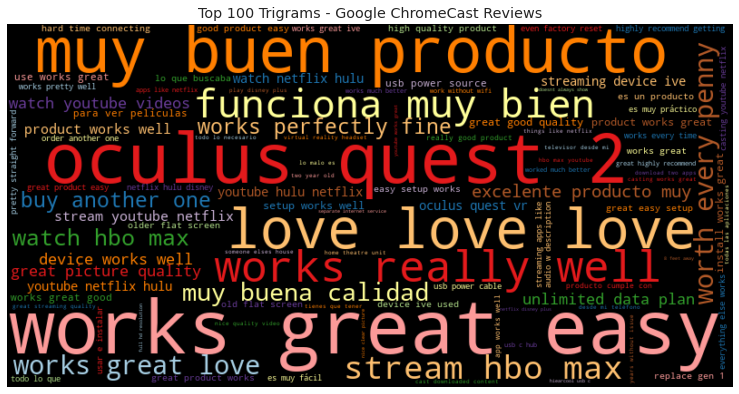

In [41]:
# Create a word cloud for google product
google = ['Google ChromeCast']
google_df = df[df['product'].isin(google)]

# Plot Word Cloud - top 100 words
plt.figure(figsize=(13,8))

# google chromecast reviews only
freq_df = count_words(google_df)
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Words - Google ChromeCast Reviews")
plt.show()


# Plot Word Cloud - bigrams
plt.figure(figsize=(13,8))

# call count_words function on google
freq_df = count_words(google_df, column="bigrams")

# select top 100 bigrams for google
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Bigrams - Google ChromeCast Reviews")
plt.show()


# Plot Word Cloud - trigrams
plt.figure(figsize=(13,8))

# call count_words function on google
freq_df = count_words(google_df, column="trigrams")

# select top 100 trigrams - google
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Trigrams - Google ChromeCast Reviews")
plt.show()

**Roku Remote Reviews Word Cloud**

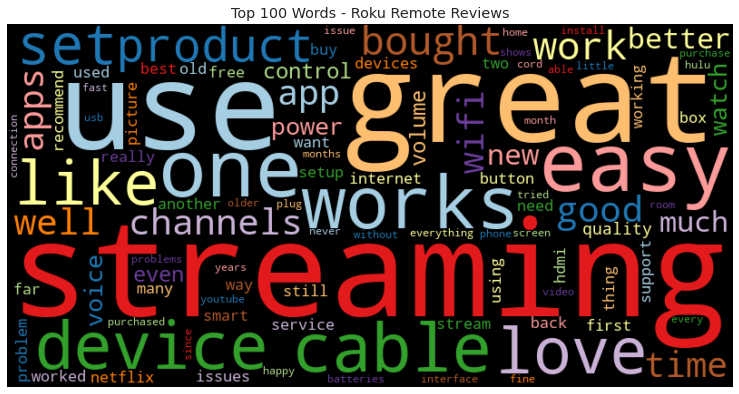

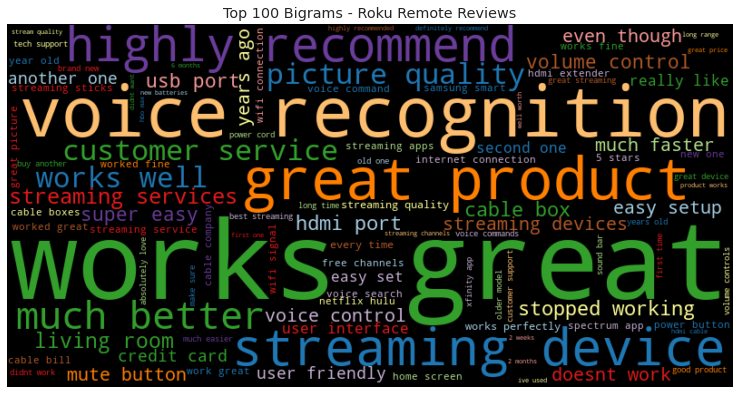

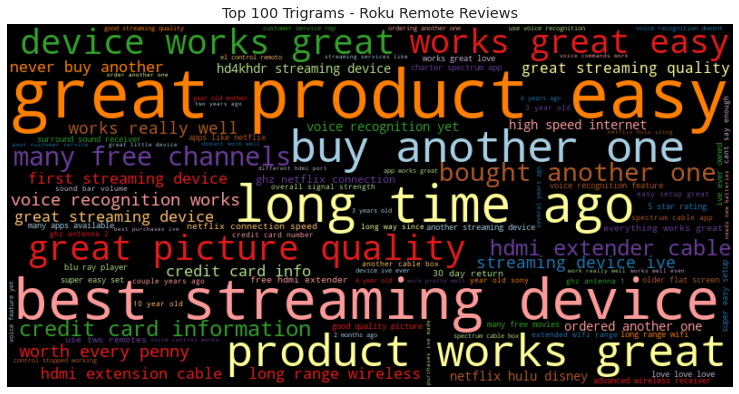

In [42]:
# Create a word cloud for roku product
roku = ['Roku Remote']
roku_df = df[df['product'].isin(roku)]

# Plot Word Cloud - top 100 words
plt.figure(figsize=(13,8))

# roku reviews only
freq_df = count_words(roku_df)
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Words - Roku Remote Reviews")
plt.show()

# Plot Word Cloud - bigrams
plt.figure(figsize=(13,8))

# call count_words function on roku 
freq_df = count_words(roku_df, column="bigrams")

# select top 100 bigrams for roku
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Bigrams - Roku Remote Reviews")
plt.show()


# Plot Word Cloud - trigrams
plt.figure(figsize=(13,8))

# call count_words function on roku
freq_df = count_words(roku_df, column="trigrams")

# select top 100 trigrams - roku
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Trigrams - Roku Remote Reviews")
plt.show()

**Apple TV Reviews Word Cloud**

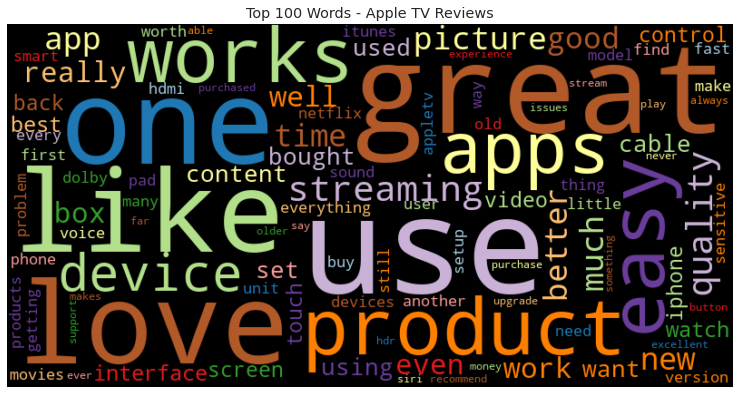

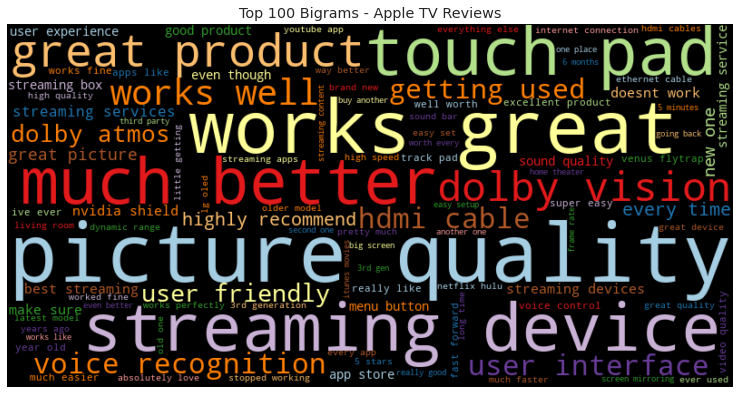

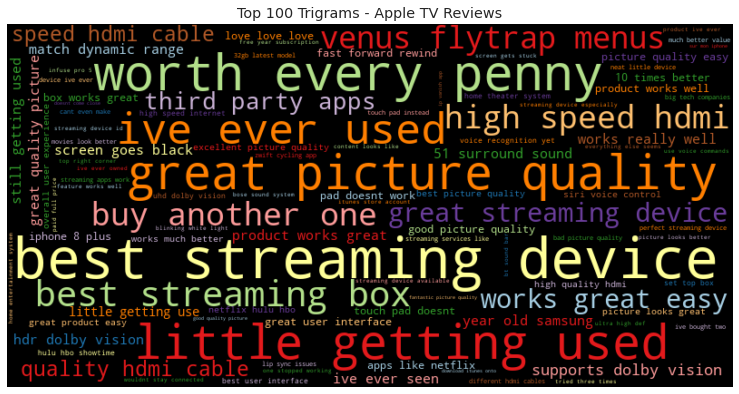

In [43]:
# Create a word cloud for apple product
apple = ['Apple TV']
apple_df = df[df['product'].isin(apple)]

# Plot Word Cloud - top 100 words
plt.figure(figsize=(13,8))

# apple tv reviews only
freq_df = count_words(apple_df)
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Words - Apple TV Reviews")
plt.show()

# Plot Word Cloud - bigrams
plt.figure(figsize=(13,8))

# call count_words function on apple
freq_df = count_words(apple_df, column="bigrams")

# select top 100 bigrams for apple
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Bigrams - Apple TV Reviews")
plt.show()


# Plot Word Cloud - trigrams
plt.figure(figsize=(13,8))

# call count_words function on apple
freq_df = count_words(apple_df, column="trigrams")

# select top 100 trigrams - apple
wordcloud(freq_df['freq'], max_words= 100)
plt.title("Top 100 Trigrams - Apple TV Reviews")
plt.show()


# Data Preparation

In [44]:
# sample only 5 rows
df.sample(5)

,review_title,review_text,review_star,date,author,page,product,polarity,review_len,word_count,clean_reviews,bigrams,trigrams
2124,A+ The Haters Are Struggling With More Than Re...,Setup is a breeze. Love connectivity with my i...,5.0,"Reviewed in the United States on July 25, 2020",Chip Hamilton Cage,213,Apple TV,-0.176786,323,55,"[setup, breeze, love, connectivity, iphone, li...","[breeze love, love connectivity, iphone like, ...","[breeze love connectivity, iphone like watchin..."
4348,"It’s perfect, a lot of movies better than Netflix","It’s perfect, a lot of movies better than Netflix",5.0,"Reviewed in the United States on December 18, ...",Avyanna Nandlal,435,Amazon Fire TV Stick,0.750000,49,9,"[perfect, lot, movies, better, netflix]",[movies better],[]
586,Will not work with Xfinity Stream app,Easy to set up but after several attempts it w...,3.0,"Reviewed in the United States on February 3, 2019",Harry,59,Apple TV,0.155570,960,183,"[easy, set, several, attempts, connect, wifi, ...","[several attempts, hard reboot, worked fine, f...","[worked fine xfinity, fine xfinity customers, ..."
1887,Works way better then old one,Works great on my non smart tv for Netflix,5.0,"Reviewed in the United States on March 22, 2022",Angel S,189,Amazon Fire TV Stick,0.507143,42,9,"[works, great, non, smart, netflix]","[works great, non smart]",[]
1443,Great HD picture and Infinity Beta,Downsized cable! Apps and more. Now we have Fr...,5.0,"Reviewed in the United States on November 19, ...",oneolddawg,145,Roku Remote,0.300000,92,16,"[downsized, cable, apps, free, infinity, beta,...","[downsized cable, cable apps, free infinity, i...","[downsized cable apps, free infinity beta, bas..."


## Removing Unecessary Columns 

In [45]:
# drop these columns
drop_columns = ['review_title', 'date', 'author', 'page', 'product',
 'polarity', 'review_len', 'word_count', 'clean_reviews', 'bigrams', 'trigrams']

# drop
df.drop(drop_columns, inplace=True, axis = 1)

# see 10 random samples
df.sample(10)

,review_text,review_star
3047,This product works as advertised. It casts to ...,5.0
1311,"Super easy to use, I just wish they made all c...",5.0
3562,I haven’t had any issues with the fire stick!,5.0
487,Easy to setup and works perfectly,5.0
1613,I replaced the old Apple TV by just inserting ...,5.0
957,We replaced a several year old firestick with ...,5.0
1030,Connected to my router just fine wish I could ...,5.0
1107,The set up was practically instant. The user i...,5.0
3915,Works just as expected and seems like it even ...,4.0
725,I decided not to buy cable in my apartment sin...,5.0


# Cleaning Reviews 

- Remove Punctuation
- Remove extra white space
- Tokenize on white space pattern
- Fold to lowercase
- Remove stopwords
- Remove numbers
- Remove unicode characters

In [46]:
# punctuation dictionary
punctuation = set(punctuation) 
include_punctuation = {'’', '”', '“'}
punctuation |= include_punctuation

# stop words and other words to be excluded
include_stopwords = {'could', 'shouldn', 'oh', 'know', 'im', 'en',
'go', 'get', 'got', 'gonna', 'la', 'na', 'de', 'gon', 'got' 'must', 'would', 'also', 
                    'apple', 'Apple', 'Amazon', 'amazon', 
                     'roku', 'Roku', 'roku remote', 'Rokue Remote',
                     'Google', 'google', 'chromecast', 'Chromecast', 
                    'Chrome Cast', 'chrome cast', 'chrome', 'cast'
                     'Fire TV Stick', 'prime', 'firestick4ktv',
                     'firestick', 'fire tv', 'fire tv stick', 'fire', 
                     'firesticks','tv', 'remote', '4k', 'stick', 'dont', "it's", 'tvs',
                    'etc'}

# include the dictionary of stop words
sw |= include_stopwords

# useful white space pattern
whitespace_pattern = re.compile(r"\s+")

def decontracted(phrase):
    """
    split up decontracted words from a column of texts
    
    """
    # add extra white space
    phrase = re.sub('(?<=[.,!?()/:;])(?=[^\s])', r' ',  phrase)
   
    # specific
    phrase = re.sub(r"she/her", "she her",phrase)
    phrase = re.sub(r"he/him", "he him",phrase)
    phrase = re.sub(r"they/them", "they them",phrase)
    phrase = re.sub(r"won\’t", "will not", phrase)
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\’t", "can not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r'\<.*\>', '', phrase)

    # general
    phrase = re.sub(r"n\’t", " not", phrase)
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\’re", " are", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\’s", " is", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\’d", " would", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\’ll", " will", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\’t", " not", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\’ve", " have", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\’m", " am", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    phrase = re.sub(r"don’t", "do not", phrase)
    phrase = re.sub(r"it's", "it is", phrase)
    phrase = re.sub(r"it’s", "it is", phrase)
    phrase = re.sub(r"we've", "we have", phrase)
    phrase = re.sub("\w+\d+", "", phrase)
    phrase = re.sub("\d+\w+", "", phrase)
    phrase = re.sub("\d+", " ", phrase)

    return phrase

def remove_stop(tokens) :
    """
    remove stop words from a column of texts
    """
    
    not_stop_words = [word for word in tokens if word not in sw]
    return not_stop_words
 
def remove_punctuation(text) : 
    """
    remove punctuation from a column of texts
    """
    return("".join([ch for ch in text if ch not in punctuation]))

def tokenize(text) : 
    """ Splitting on whitespace"""
    
    # modify this function to return tokens
    tokens = re.split(whitespace_pattern, text)
    return(tokens)


def remove_whitespace_token(tokens):
    """ Remove whitespace tokens"""
    
    # loop through each token to find whitespace token and remove
    for i in tokens:
        if '' in tokens:
            tokens.remove('')
    return tokens

def prepare(text, pipeline) :
    """
    prepare function applies each cleaning transformation
    function onto a column of text
    """
    tokens = str(text)
    
    for transform in pipeline : 
        tokens = transform(tokens)
        
    return(tokens)


# list of cleaning functions
my_pipeline = [str.lower, decontracted, remove_punctuation, tokenize, remove_whitespace_token, remove_stop]

In [47]:
# for cleaning and tokenizng reviews
df['clean_reviews'] = df['review_text'].apply(prepare,pipeline=my_pipeline)

# remove any unicode characters
df['clean_reviews'].replace({r'[^\x00-\x7F]+':''}, regex=True, inplace=True)

# drop original reviews column
df.drop(columns = ['review_text'], axis = 1, inplace = True)

# drop rows with no tokens
df = df[df['clean_reviews'].str.len() != 0]

# untokenize plot descriptions
df['clean_reviews'] = df['clean_reviews'].apply(lambda x: TreebankWordDetokenizer().detokenize(x))

# 10 random rows
df.sample(10)

,review_star,clean_reviews
2363,5.0,easy setup enjoy watching movie phone
2206,5.0,using main
2056,2.0,first generation surprisingly simple screen la...
1652,1.0,bought end worked fine recently march update t...
1245,5.0,works expected
2208,5.0,great
1844,5.0,streaming plus great addon nonsmart easy set e...
4172,1.0,support iphone xr pictures
3095,4.0,always need even smarttv number apps available...
2201,3.0,update still love thing fact bought second one...


# Split the data set for training and testing 


- Checking for Class Imbalance
- Split Data on balanced data set
- Use TF-IDF data pre-processing on training data

1. Over-sampling the Minority class with SMOTE-ENN
    - Checking for Class Imbalance after Oversampling (SMOTE-ENN)

2. Under-sampling the Majority class with Near-Miss Undersampling
    - Checking for Class Imbalance after Near-Miss Undersampling

3. Under-sampling the Majority class with One-Sided Selection (OSS) Undersampling
    - Checking for Class Imbalance after One-Sided Selection (OSS) Undersampling


## Checking for Class Imbalance

In [48]:
def convert_ratings(x):
    """
    Convert star ratings to positive and negative reviews  
    
    """
    if x <= 2.0:
        return 'Negative'
    if x >= 4.0:
        return 'Positive'

# remove 3/5 ratings and reviews
df = df[df['review_star'] != 3.0]

# convert ratings to classes
df['review_star'] = df['review_star'].apply(lambda x: convert_ratings(x))

In [49]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
rating_counts = pd.DataFrame(df[['review_star']].value_counts()).reset_index().rename( \
    columns={'review_star': 'Ratings', 0:'count'})

# add a sort index
rating_counts['Ratings_for_sorting'] = rating_counts['Ratings']

# convert ratings to str type for visualization
rating_counts['Ratings'] = rating_counts['Ratings'].astype(str)

# Sort order by custom column and display 
rating_counts.sort_values(by=['Ratings_for_sorting'], inplace = True)

# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(rating_counts, x="Ratings", y="count", color="Ratings", 
             title= "Customer Ratings - Checking for Class Imbalance", text_auto = '.2s', 
             color_discrete_map={'Negative':'red',  'Positive':'rgb(27,158,119)'})

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
 marker_line_width=1.5, opacity = 0.75)

## Train-Test-Split

In [50]:
# Features
X = df['clean_reviews']

# Target Variable
y = df[['review_star']]

# Split data set on 80% training and 20% test and keep target variable classes balanced
X_train, X_test, Y_train, Y_test = train_test_split(X,
y, test_size=0.2, random_state=42, stratify=y)

# Print shapes of training and testing data
print('Size of Training Data ', X_train.shape[0])
print('Size of Test Data ', X_test.shape[0])

Size of Training Data  13548
Size of Test Data  3388


## Use TF-IDF for data pre-processing

In [51]:
# use tfidf vectorizer on training data
tfidf = TfidfVectorizer(stop_words=sw)
tfidf.fit(X_train)

## save your model in disk
joblib.dump(tfidf, 'tfidf.pkl') 

# use tfidf on training data
X_train = tfidf.transform(X_train)

# use tfidf vectorizer on test data
X_test = tfidf.transform(X_test)

## Over-sampling the Minority class using SMOTE with Edited Nearest Neighbor (ENN)

This method combines the SMOTE ability to generate synthetic examples for minority class and ENN ability to delete some observations from both classes that are identified as having different class between the observation’s class and its K-nearest neighbor majority class.

In [52]:
# use SMOTE method for over-sampling on training set only
oversample = SMOTEENN()
X_train_smote, Y_train_smote = oversample.fit_resample(X_train, Y_train)

## Checking for Class Imbalance after SMOTE with ENN

In [53]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
rating_counts = pd.DataFrame(pd.DataFrame(Y_train_smote).rename(columns = {0:'review_star'}).value_counts()).reset_index().rename( \
    columns={'review_star': 'Ratings', 0:'count'})

# add a sort index
rating_counts['Ratings_for_sorting'] = rating_counts['Ratings']

# convert ratings to str type for visualization
rating_counts['Ratings'] = rating_counts['Ratings'].astype(str)

# Sort order by custom column and display 
rating_counts.sort_values(by=['Ratings_for_sorting'], inplace = True)

# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(rating_counts, x="Ratings", y="count", color="Ratings", 
             title= "Customer Ratings - After SMOTE (Oversampling)", text_auto = '.2s', 
             color_discrete_map={'Negative':'red',  'Positive':'rgb(27,158,119)'})

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
 marker_line_width=1.5, opacity = 0.75)

## Near-Missing Undersampling (Version 3)

NearMiss-1 selects examples from the majority class that have the smallest average distance to the three closest examples from the minority class. NearMiss-2 selects examples from the majority class that have the smallest average distance to the three furthest examples from the minority class. NearMiss-3 involves selecting a given number of majority class examples for each example in the minority class that are closest.

We will use version 3.

In [54]:
# near miss undersampling
nr = NearMiss(version = 1, n_neighbors=3) 

# fit to training data only
X_train_near, Y_train_near= nr.fit_resample(X_train, Y_train)

## Checking for Class Imbalance after Near-miss Undersampling 

In [55]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
rating_counts = pd.DataFrame(pd.DataFrame(Y_train_near).rename(columns = {0:'review_star'}).value_counts()).reset_index().rename( \
    columns={'review_star': 'Ratings', 0:'count'})

# add a sort index
rating_counts['Ratings_for_sorting'] = rating_counts['Ratings']

# convert ratings to str type for visualization
rating_counts['Ratings'] = rating_counts['Ratings'].astype(str)

# Sort order by custom column and display 
rating_counts.sort_values(by=['Ratings_for_sorting'], inplace = True)

# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(rating_counts, x="Ratings", y="count", color="Ratings", 
             title= "Customer Ratings - After Near-Miss Undersampling", text_auto = '.2s', 
             color_discrete_map={'Negative':'red',  'Positive':'rgb(27,158,119)'})

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
 marker_line_width=1.5, opacity = 0.75)

## One-Sided Selection Undersampling

One-Sided Selection, or OSS for short, is an undersampling technique that combines Tomek Links and the Condensed Nearest Neighbor (CNN) Rule.

In [56]:
# condensed nearest neighbor undersampling
oss = OneSidedSelection(n_neighbors=1, n_seeds_S=200)

# fit to training data only
X_train_oss, Y_train_oss= oss.fit_resample(X_train, Y_train) 

## Checking for Class Imbalance after One-Sided Selection Undersampling

In [57]:
# create a data frame to count the number of customer reviews by products and also rename a column as count
rating_counts = pd.DataFrame(pd.DataFrame(Y_train_oss).rename(columns = {0:'review_star'}).value_counts()).reset_index().rename( \
    columns={'review_star': 'Ratings', 0:'count'})

# add a sort index
rating_counts['Ratings_for_sorting'] = rating_counts['Ratings']

# convert ratings to str type for visualization
rating_counts['Ratings'] = rating_counts['Ratings'].astype(str)

# Sort order by custom column and display 
rating_counts.sort_values(by=['Ratings_for_sorting'], inplace = True)

# use plotly to create a bar graph of number of reviews by brand and using customized color coding 
fig = px.bar(rating_counts, x="Ratings", y="count", color="Ratings", 
             title= "Customer Ratings - After One-Sided Selection Undersampling", text_auto = '.2s', 
             color_discrete_map={'Negative':'red',  'Positive':'rgb(27,158,119)'})

# figure customization
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False,
 marker_line_width=1.5, opacity = 0.75)

# Modeling and Evaluation

## Baseline Model - Dummy Classifier

In [58]:
# Baseline Model - Dummy Classifier
clf = DummyClassifier(strategy='most_frequent')

# Fit to SMOTE+ENN training data
clf.fit(X_train_smote, Y_train_smote)

# Make predictions on original unsampled test data
Y_pred_smote_baseline = clf.predict(X_test)

# Print out Performance scores
print ('Accuracy Score with SMOTE+ENN Training Data ', round(accuracy_score(Y_test, Y_pred_smote_baseline),3))
print(classification_report(Y_test, Y_pred_smote_baseline))

Accuracy Score with SMOTE+ENN Training Data  0.111
              precision    recall  f1-score   support

    Negative       0.11      1.00      0.20       375
    Positive       0.00      0.00      0.00      3013

    accuracy                           0.11      3388
   macro avg       0.06      0.50      0.10      3388
weighted avg       0.01      0.11      0.02      3388



## Dummy Classifier with Near-miss Sampling Training Data

In [59]:
# Baseline Model - Dummy Classifier
clf = DummyClassifier(strategy='most_frequent')

# Fit to Near-miss sampling training data
clf.fit(X_train_near, Y_train_near)

# Make predictions on original unsampled test data
Y_pred_near_baseline = clf.predict(X_test)

# Print out Performance scores
print ('Accuracy Score with near-miss sampling Training Data ', round(accuracy_score(Y_test, Y_pred_near_baseline),3))
print(classification_report(Y_test, Y_pred_near_baseline))

Accuracy Score with near-miss sampling Training Data  0.111
              precision    recall  f1-score   support

    Negative       0.11      1.00      0.20       375
    Positive       0.00      0.00      0.00      3013

    accuracy                           0.11      3388
   macro avg       0.06      0.50      0.10      3388
weighted avg       0.01      0.11      0.02      3388



## Dummy Classifier with One-sided Selection Training Data

In [60]:
# Baseline Model - Dummy Classifier
clf = DummyClassifier(strategy='most_frequent')

# Fit to One-Sided Selection sampling training data
clf.fit(X_train_oss, Y_train_oss)

# Make predictions on original unsampled test data
Y_pred_oss_baseline = clf.predict(X_test)

# Print out Performance scores
print ('Accuracy Score with one-sided selection sampling Training Data ', 
       round(accuracy_score(Y_test, Y_pred_oss_baseline),3))
print(classification_report(Y_test, Y_pred_oss_baseline))

Accuracy Score with one-sided selection sampling Training Data  0.889
              precision    recall  f1-score   support

    Negative       0.00      0.00      0.00       375
    Positive       0.89      1.00      0.94      3013

    accuracy                           0.89      3388
   macro avg       0.44      0.50      0.47      3388
weighted avg       0.79      0.89      0.84      3388



## SVM Classifier - Hyperparameter Tuning

- Hyper-parameter tuning on  Training SMOTE+ENN Data
- Hyper-parameter tuning on  Training Near-miss Sampling Data
- Hyper-parameter tuning on  Training One-sided Selection Sampling Data

In [61]:
# Add parameters in pipeline
training_pipeline = Pipeline(
steps=[
('model', LinearSVC(random_state=42, tol=1e-5))])
grid_param = [{
'model__penalty': ['l1', 'l2'],
'model__loss': ['hinge'],
'model__max_iter': [10000]
}, {
'model__C': [1, 10],
'model__tol': [1e-2, 1e-3]
}]

### SVM Classifier - Training on SMOTE+ENN Data 

In [62]:
# grid search to find best parameters
gridSearchProcessor = GridSearchCV(estimator=training_pipeline,
param_grid=grid_param, cv=5, n_jobs = -1)

# SMOTE+ENN data
gridSearchProcessor.fit(X_train_smote, Y_train_smote)

# best parameters for SMOTE+ENN Data
smote_best_params = gridSearchProcessor.best_params_

# best model for SMOTE+ENN Data
smote_best_model = gridSearchProcessor.best_estimator_

# print out best parameters for SMOTE+ENN Data
print("Best alpha parameter identified by grid search for SMOTE+ENN Data ", smote_best_params)
smote_best_result = gridSearchProcessor.best_score_
print("Best result identified by grid search for SMOTE+ENN Data", smote_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

Best alpha parameter identified by grid search for SMOTE+ENN Data  {'model__C': 10, 'model__tol': 0.01}
Best result identified by grid search for SMOTE+ENN Data 0.9871247291860105


,rank_test_score,mean_test_score,params
4,1,0.987125,"{'model__C': 10, 'model__tol': 0.01}"
5,1,0.987125,"{'model__C': 10, 'model__tol': 0.001}"
2,3,0.986196,"{'model__C': 1, 'model__tol': 0.01}"
3,3,0.986196,"{'model__C': 1, 'model__tol': 0.001}"
1,5,0.983720,"{'model__loss': 'hinge', 'model__max_iter': 10..."


In [63]:
# Model Evaluation
Y_pred_smote = smote_best_model.predict(X_test)
print('Accuracy Score for SMOTE+ENN Data ', accuracy_score(Y_test, Y_pred_smote))
print(classification_report(Y_test, Y_pred_smote))

Accuracy Score for SMOTE+ENN Data  0.7529515938606848
              precision    recall  f1-score   support

    Negative       0.30      0.92      0.45       375
    Positive       0.99      0.73      0.84      3013

    accuracy                           0.75      3388
   macro avg       0.64      0.83      0.65      3388
weighted avg       0.91      0.75      0.80      3388



### SVM Classifier - Training on Near-miss Sampling Data 

In [64]:
# grid search to find best parameters
gridSearchProcessor = GridSearchCV(estimator=training_pipeline,
param_grid=grid_param, cv=5, n_jobs = -1)

# Near-miss sampling data
gridSearchProcessor.fit(X_train_near, Y_train_near)

# best parameters for Near-miss Sampling Data
near_best_params = gridSearchProcessor.best_params_

# best model for Near-miss Sampling Data
near_best_model = gridSearchProcessor.best_estimator_

# print out best parameters for Near-miss Sampling Data
print("Best alpha parameter identified by grid search for Near-miss Sampling Data ", near_best_params)
near_best_result = gridSearchProcessor.best_score_
print("Best result identified by grid search for Near-miss Sampling Data", near_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

Best alpha parameter identified by grid search for Near-miss Sampling Data  {'model__loss': 'hinge', 'model__max_iter': 10000, 'model__penalty': 'l2'}
Best result identified by grid search for Near-miss Sampling Data 0.8761602671118531


,rank_test_score,mean_test_score,params
1,1,0.876160,"{'model__loss': 'hinge', 'model__max_iter': 10..."
2,2,0.873492,"{'model__C': 1, 'model__tol': 0.01}"
3,2,0.873492,"{'model__C': 1, 'model__tol': 0.001}"
4,4,0.856471,"{'model__C': 10, 'model__tol': 0.01}"
5,5,0.856137,"{'model__C': 10, 'model__tol': 0.001}"


In [65]:
# Model Evaluation
Y_pred_near = near_best_model.predict(X_test)
print('Accuracy Score for Near-miss Sampling Data ', accuracy_score(Y_test, Y_pred_near))
print(classification_report(Y_test, Y_pred_near))

Accuracy Score for Near-miss Sampling Data  0.7795159386068476
              precision    recall  f1-score   support

    Negative       0.32      0.91      0.48       375
    Positive       0.99      0.76      0.86      3013

    accuracy                           0.78      3388
   macro avg       0.65      0.84      0.67      3388
weighted avg       0.91      0.78      0.82      3388



### SVM Classifier - Training on One-sided Selection Sampling Data 

In [66]:
# grid search to find best parameters
gridSearchProcessor = GridSearchCV(estimator=training_pipeline,
param_grid=grid_param, cv=5, n_jobs = -1)

# One-sided selection sampling data
gridSearchProcessor.fit(X_train_oss, Y_train_oss)

# best parameters for One-sided selection Sampling Data
oss_best_params = gridSearchProcessor.best_params_

# best model for One-sided selection Sampling Data
oss_best_model = gridSearchProcessor.best_estimator_

# print out best parameters for One-sided selection Sampling Data
print("Best alpha parameter identified by grid search for One-sided selection Sampling Data ", oss_best_params)
oss_best_result = gridSearchProcessor.best_score_
print("Best result identified by grid search for One-sided selection Sampling Data", oss_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

Best alpha parameter identified by grid search for One-sided selection Sampling Data  {'model__loss': 'hinge', 'model__max_iter': 10000, 'model__penalty': 'l2'}
Best result identified by grid search for One-sided selection Sampling Data 0.9293988109571231


,rank_test_score,mean_test_score,params
1,1,0.929399,"{'model__loss': 'hinge', 'model__max_iter': 10..."
2,2,0.927616,"{'model__C': 1, 'model__tol': 0.01}"
3,2,0.927616,"{'model__C': 1, 'model__tol': 0.001}"
4,4,0.916384,"{'model__C': 10, 'model__tol': 0.01}"
5,4,0.916384,"{'model__C': 10, 'model__tol': 0.001}"


In [67]:
# Model Evaluation
Y_pred_oss = oss_best_model.predict(X_test)
print('Accuracy Score for One-sided selection Sampling Data ', accuracy_score(Y_test, Y_pred_oss))
print(classification_report(Y_test, Y_pred_oss))

Accuracy Score for One-sided selection Sampling Data  0.9462809917355371
              precision    recall  f1-score   support

    Negative       0.82      0.66      0.73       375
    Positive       0.96      0.98      0.97      3013

    accuracy                           0.95      3388
   macro avg       0.89      0.82      0.85      3388
weighted avg       0.94      0.95      0.94      3388



## Random Forest Classifier - Hyperparameter Tuning

- Hyper-parameter tuning on  Training SMOTE+ENN Data
- Hyper-parameter tuning on  Training Near-miss Sampling Data
- Hyper-parameter tuning on  Training One-sided Selection Sampling Data

In [68]:
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Rf model
rf = RandomForestClassifier(random_state=42)

random_grid = {'n_estimators': [100,300,500],
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}       


### RF Classifier - Training on SMOTE+ENN Data 

In [69]:
# random search to find best parameters
rf_gridSearchProcessor = RandomizedSearchCV(estimator=rf,\
                                            param_distributions=random_grid, 
                                            cv=3, n_jobs = -1,
                                            n_iter = 100)

# SMOTE+ENN data
rf_gridSearchProcessor.fit(X_train_smote, Y_train_smote)

# best parameters for SMOTE+ENN Data
rf_smote_best_params = rf_gridSearchProcessor.best_params_

# best model for SMOTE+ENN Data
rf_smote_best_model = rf_gridSearchProcessor.best_estimator_

# print out best parameters for SMOTE+ENN Data
print("Best alpha parameter identified by grid search for SMOTE+ENN Data ", rf_smote_best_params)
rf_smote_best_result = rf_gridSearchProcessor.best_score_
print("Best result identified by grid search for SMOTE+ENN Data", rf_smote_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(rf_gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

Best alpha parameter identified by grid search for SMOTE+ENN Data  {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}
Best result identified by grid search for SMOTE+ENN Data 0.9944289693593314


,rank_test_score,mean_test_score,params
90,1,0.994429,"{'n_estimators': 300, 'min_samples_split': 5, ..."
57,2,0.994119,"{'n_estimators': 500, 'min_samples_split': 10,..."
60,3,0.993872,"{'n_estimators': 100, 'min_samples_split': 2, ..."
97,4,0.993748,"{'n_estimators': 300, 'min_samples_split': 5, ..."
47,5,0.987991,"{'n_estimators': 500, 'min_samples_split': 10,..."


In [70]:
# Model Evaluation
Y_pred_smote_rf = rf_smote_best_model.predict(X_test)
print('Accuracy Score for SMOTE+ENN Data ', accuracy_score(Y_test, Y_pred_smote_rf))
print(classification_report(Y_test, Y_pred_smote_rf))

Accuracy Score for SMOTE+ENN Data  0.6744391971664699
              precision    recall  f1-score   support

    Negative       0.24      0.90      0.38       375
    Positive       0.98      0.65      0.78      3013

    accuracy                           0.67      3388
   macro avg       0.61      0.77      0.58      3388
weighted avg       0.90      0.67      0.74      3388



### RF Hyper-parameter tuning on Training Near-miss Sampling Data

In [71]:
# random search to find best parameters
rf_gridSearchProcessor = RandomizedSearchCV(estimator=rf,\
                                            param_distributions=random_grid, 
                                            cv=3, n_jobs = -1,
                                            n_iter = 100)


# Near-miss data
rf_gridSearchProcessor.fit(X_train_near, Y_train_near)

# best parameters for Near-miss sampling data 
rf_near_best_params = rf_gridSearchProcessor.best_params_

# best model for Near-miss sampling data 
rf_near_best_model = rf_gridSearchProcessor.best_estimator_

# print out best parameters for Near-miss sampling data 
print("Best alpha parameter identified by grid search for Near-miss sampling data ", rf_near_best_params)
rf_near_best_result = rf_gridSearchProcessor.best_score_
print("Best result identified by grid search for Near-miss sampling data ", rf_near_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(rf_gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

Best alpha parameter identified by grid search for Near-miss sampling data  {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': False}
Best result identified by grid search for Near-miss sampling data  0.885506749234204


,rank_test_score,mean_test_score,params
3,1,0.885507,"{'n_estimators': 300, 'min_samples_split': 5, ..."
88,2,0.881837,"{'n_estimators': 500, 'min_samples_split': 10,..."
95,3,0.881505,"{'n_estimators': 100, 'min_samples_split': 10,..."
67,4,0.881503,"{'n_estimators': 500, 'min_samples_split': 2, ..."
51,5,0.880834,"{'n_estimators': 500, 'min_samples_split': 2, ..."


In [72]:
# Model Evaluation
Y_pred_near_rf = rf_near_best_model.predict(X_test)
print('Accuracy Score for SMOTE+ENN Data ', accuracy_score(Y_test, Y_pred_near_rf))
print(classification_report(Y_test, Y_pred_near_rf))

Accuracy Score for SMOTE+ENN Data  0.6915584415584416
              precision    recall  f1-score   support

    Negative       0.25      0.88      0.39       375
    Positive       0.98      0.67      0.79      3013

    accuracy                           0.69      3388
   macro avg       0.61      0.77      0.59      3388
weighted avg       0.90      0.69      0.75      3388



### RF Hyper-parameter tuning on Training One-sided Selection Sampling Data

In [73]:
# random search to find best parameters
rf_gridSearchProcessor = RandomizedSearchCV(estimator=rf,\
                                            param_distributions=random_grid, 
                                            cv=3, n_jobs = -1,
                                            n_iter = 100)

# oss data
rf_gridSearchProcessor.fit(X_train_oss, Y_train_oss)

# best parameters for oss sampling data 
rf_oss_best_params = rf_gridSearchProcessor.best_params_

# best model for oss sampling data 
rf_oss_best_model = rf_gridSearchProcessor.best_estimator_

# print out best parameters for oss sampling data 
print("Best alpha parameter identified by grid search for oss sampling data ", rf_oss_best_params)
rf_oss_best_result = rf_gridSearchProcessor.best_score_
print("Best result identified by grid search for oss sampling data ", rf_oss_best_result)


# see other parameter results
gridsearch_results = pd.DataFrame(rf_gridSearchProcessor.cv_results_)
gridsearch_results[['rank_test_score', 'mean_test_score',
'params']].sort_values(by=['rank_test_score'])[:5]

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/home/jimmynguyen/anaconda3/envs/ads599/lib/python3.8/s

Best alpha parameter identified by grid search for oss sampling data  {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}
Best result identified by grid search for oss sampling data  0.9039936040549605


,rank_test_score,mean_test_score,params
93,1,0.903994,"{'n_estimators': 500, 'min_samples_split': 5, ..."
41,2,0.903281,"{'n_estimators': 300, 'min_samples_split': 5, ..."
36,3,0.898288,"{'n_estimators': 100, 'min_samples_split': 10,..."
16,4,0.897575,"{'n_estimators': 100, 'min_samples_split': 5, ..."
29,5,0.897041,"{'n_estimators': 100, 'min_samples_split': 5, ..."


In [74]:
# Model Evaluation
Y_pred_oss_rf = rf_oss_best_model.predict(X_test)
print('Accuracy Score for One-sided Sampling Data ', accuracy_score(Y_test, Y_pred_oss_rf))
print(classification_report(Y_test, Y_pred_oss_rf))

Accuracy Score for One-sided Sampling Data  0.922077922077922
              precision    recall  f1-score   support

    Negative       0.85      0.36      0.51       375
    Positive       0.93      0.99      0.96      3013

    accuracy                           0.92      3388
   macro avg       0.89      0.68      0.73      3388
weighted avg       0.92      0.92      0.91      3388



# Model Comparison

In [75]:
## make data frame for model performance comparison
data = ['SMOTE+ENN Sampling', 'Near-miss Sampling', 'One-sided Selection Sampling Data'] * 3
models = ['baseline', 'baseline', 'baseline',\
          'SVM', 'SVM', 'SVM',\
         'Random Forest', 'Random Forest', 'Random Forest']
params = ['Most Frequent', 'Most Frequent', 'Most Frequent', \
          smote_best_params, near_best_params, oss_best_params,\
         rf_smote_best_params, rf_near_best_params, rf_oss_best_params]
performance = [accuracy_score(Y_test, Y_pred_smote_baseline), \
               accuracy_score(Y_test, Y_pred_near_baseline),\
               accuracy_score(Y_test, Y_pred_oss_baseline), \
               accuracy_score(Y_test, Y_pred_smote), \
              accuracy_score(Y_test, Y_pred_near), \
              accuracy_score(Y_test, Y_pred_oss), \
              accuracy_score(Y_test, Y_pred_smote_rf), \
              accuracy_score(Y_test, Y_pred_near_rf), \
              accuracy_score(Y_test, Y_pred_oss_rf)]

model_comp = pd.DataFrame(list(zip(data, models, params, performance))) 

# reanming the DataFrame columns
model_comp.rename(columns = {0:'data', 
                             1:'model',
                             2:'parameters',
                             3:'accuracy score'}, 
            inplace = True)
model_comp

,data,model,parameters,accuracy score
0,SMOTE+ENN Sampling,baseline,Most Frequent,0.110685
1,Near-miss Sampling,baseline,Most Frequent,0.110685
2,One-sided Selection Sampling Data,baseline,Most Frequent,0.889315
3,SMOTE+ENN Sampling,SVM,"{'model__C': 10, 'model__tol': 0.01}",0.752952
4,Near-miss Sampling,SVM,"{'model__loss': 'hinge', 'model__max_iter': 10...",0.779516
5,One-sided Selection Sampling Data,SVM,"{'model__loss': 'hinge', 'model__max_iter': 10...",0.946281
6,SMOTE+ENN Sampling,Random Forest,"{'n_estimators': 300, 'min_samples_split': 5, ...",0.674439
7,Near-miss Sampling,Random Forest,"{'n_estimators': 300, 'min_samples_split': 5, ...",0.691558
8,One-sided Selection Sampling Data,Random Forest,"{'n_estimators': 500, 'min_samples_split': 5, ...",0.922078


# Final Model Test Unseen Data and Export 

In [76]:
# predict unseen data
unseen_data = "Very disappointed in the Apple TV 4K. \
Horrible issues with audio video syncing. The audio is never in sync with the video play back . \
It actually moves around from a little out of sync to way out of sync. Apple support? No help at all. \
And Apple actually said they are only concerned with Apple designed products and don't really care about\
how another company products work with Apple TV. This appears to be a firmware issue, That Apple has no interest\
in addressing."

unseen_data

"Very disappointed in the Apple TV 4K. Horrible issues with audio video syncing. The audio is never in sync with the video play back . It actually moves around from a little out of sync to way out of sync. Apple support? No help at all. And Apple actually said they are only concerned with Apple designed products and don't really care abouthow another company products work with Apple TV. This appears to be a firmware issue, That Apple has no interestin addressing."

In [78]:
# Pre-process amazon review
review = pd.DataFrame([unseen_data], columns=['review_text'])
    
# Start with one review:
text = review.review_text[0]

# pre-processing pipeline
review['clean_reviews'] = review['review_text'].apply(prepare,pipeline= my_pipeline)
    
# remove any unicode characters
review['clean_reviews'].replace({r'[^\x00-\x7F]+':''}, regex=True, inplace=True)

# drop original reviews column
review.drop(columns = ['review_text'], axis = 1, inplace = True)

# untokenize plot descriptions
review['clean_reviews'] = review['clean_reviews'].apply(lambda x: TreebankWordDetokenizer().detokenize(x))

review = tfidf.transform(review['clean_reviews'])

In [79]:
# SVM OSS final model
final_svm_model = oss_best_model

# probabilities/likelihood set up
final_svm_model_proba = CalibratedClassifierCV(final_svm_model, cv='prefit') 
final_svm_model_proba.fit(X_train_oss, Y_train_oss)

# put probabilities into data frame
pred_class = final_svm_model_proba.predict(review)
print(pred_class)
pd.DataFrame(np.round(final_svm_model_proba.predict_proba(review),3),\
             columns=final_svm_model_proba.classes_)

['Negative']


,Negative,Positive
0,0.985,0.015
